In [2]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 27.9 MB/s eta 0:00:00


🦯 ASSISTANT VOCAL POUR NON-VOYANT
🔊 Synthèse vocale : DÉSACTIVÉE
⚡ Vitesse de parole : 180
📱 Environnement : Google Colab

🔄 Initialisation...
🚀 Traitement en cours...

[Frame 1] 🔊 Warning Column devant vous à 2 pas ! Contournez par la GAUCHE, 1 pas.
[Frame 16] 🔊 Warning Column devant vous à 2 pas ! Contournez par la DROITE, 0 pas.
[Frame 18] 🔊 Warning Column devant vous à 2 pas ! Contournez par la DROITE, 0 pas.
📍 Frame 60


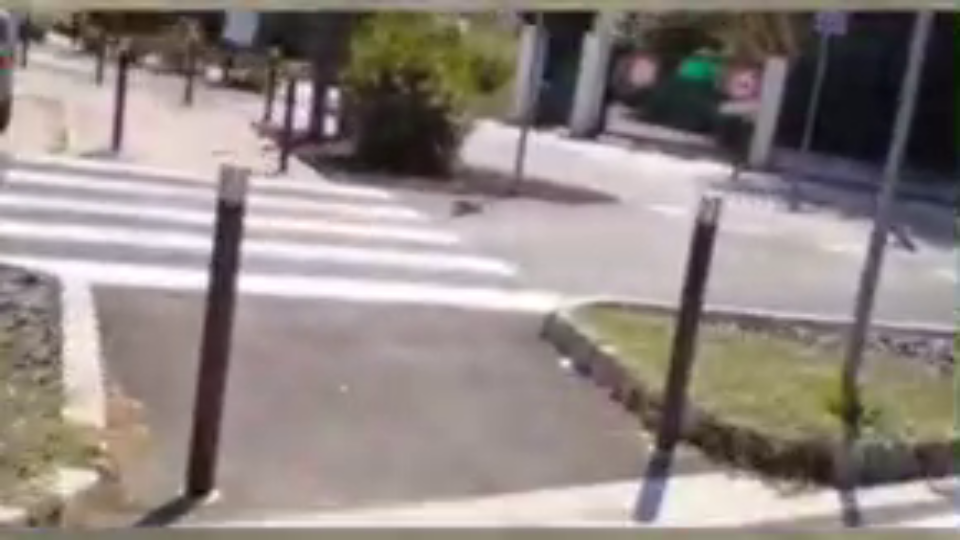

[Frame 65] 🔊 Pole devant vous à 1 pas ! Contournez par la GAUCHE, 2 pas.
[Frame 65] 🔊 Passage piéton à gauche à 5 pas. Route dégagée. Vous pouvez traverser.
[Frame 69] 🔊 Warning Column devant vous à 1 pas ! Contournez par la DROITE, 2 pas.
[Frame 77] 🔊 Attention, car très à gauche à 8 pas. Attendez.
[Frame 103] 🔊 Pole devant vous à 1 pas ! Contournez par la DROITE, 0 pas.
📍 Frame 120


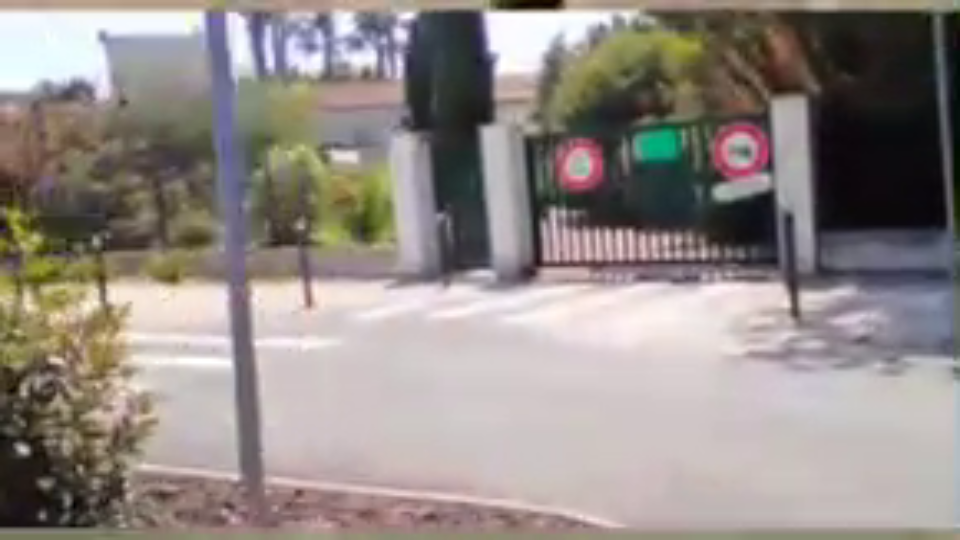

📍 Frame 180


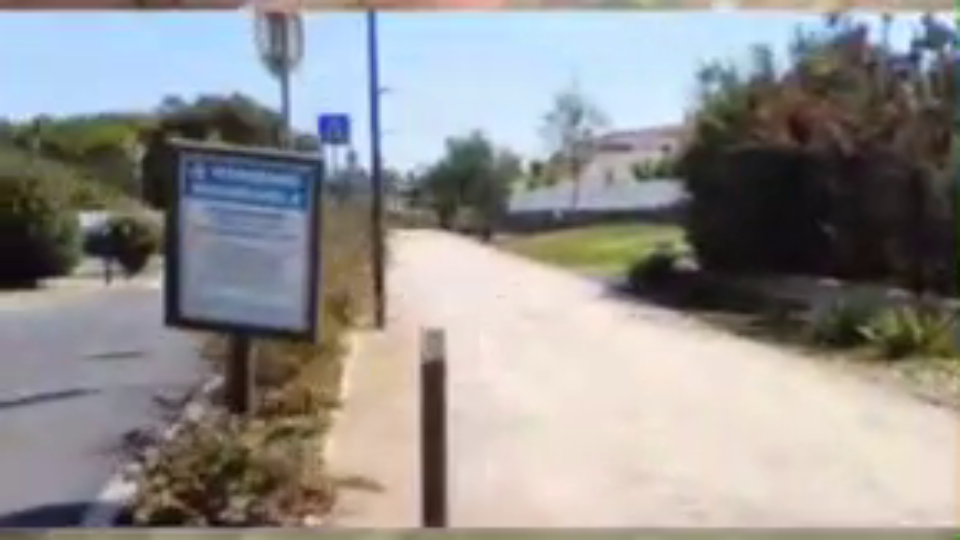

[Frame 195] 🔊 Pole devant vous à 2 pas ! Contournez par la DROITE, 2 pas.
📍 Frame 240


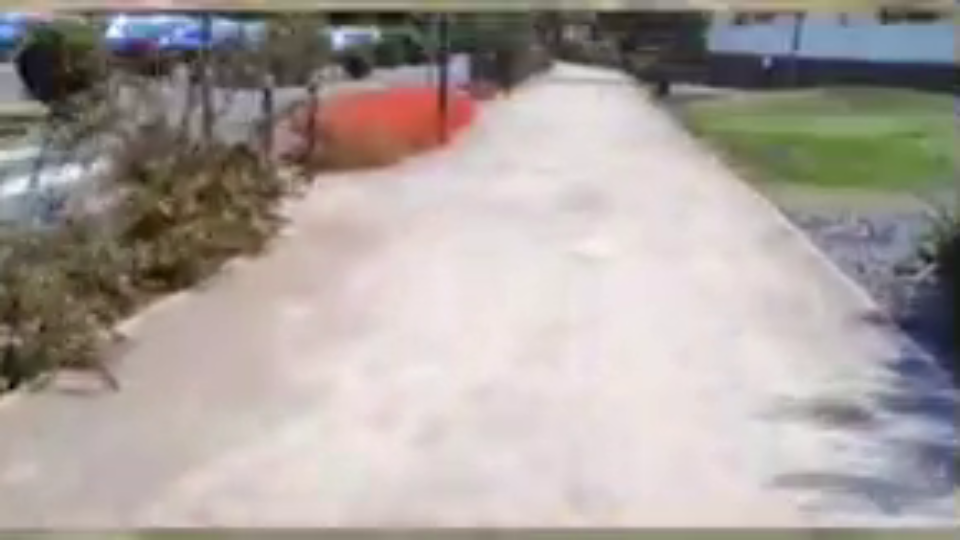

📍 Frame 300


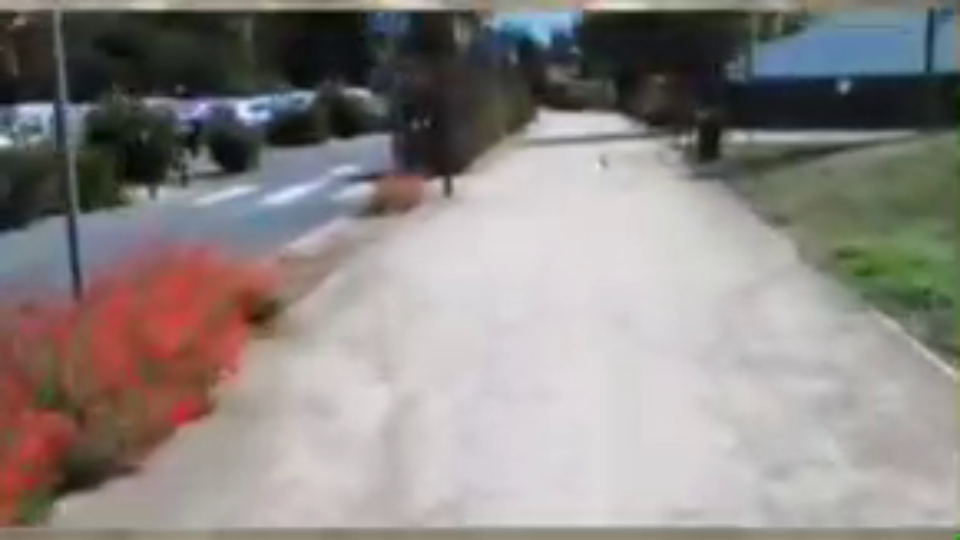

[Frame 310] 🔊 Pole devant vous à 1 pas ! Contournez par la DROITE, 2 pas.
[Frame 344] 🔊 Pole devant vous à 2 pas ! Contournez par la DROITE, 2 pas.
📍 Frame 360


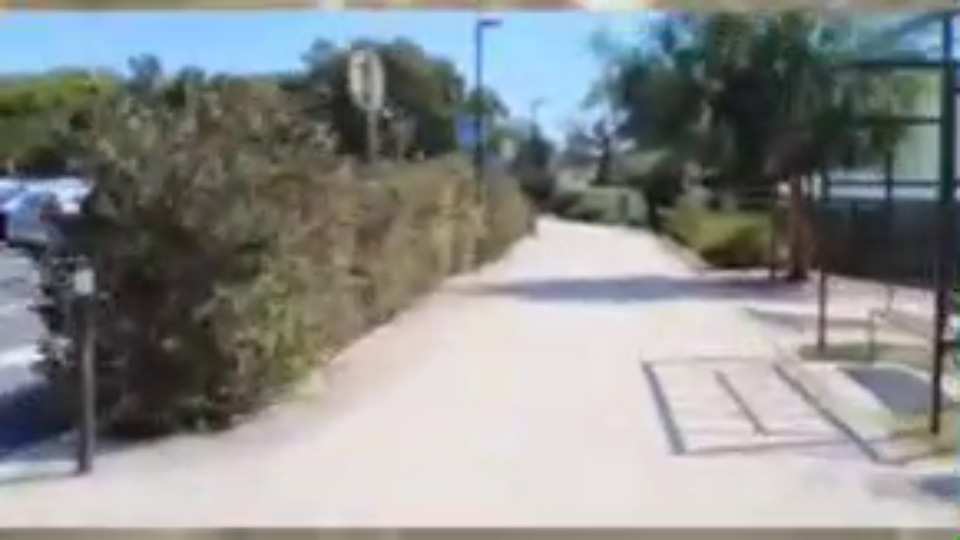

📍 Frame 420


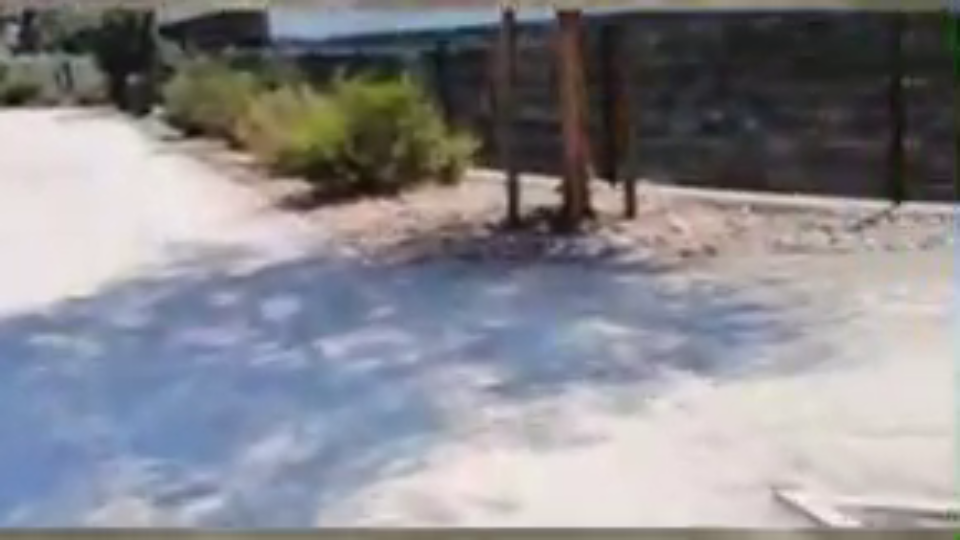

📍 Frame 480


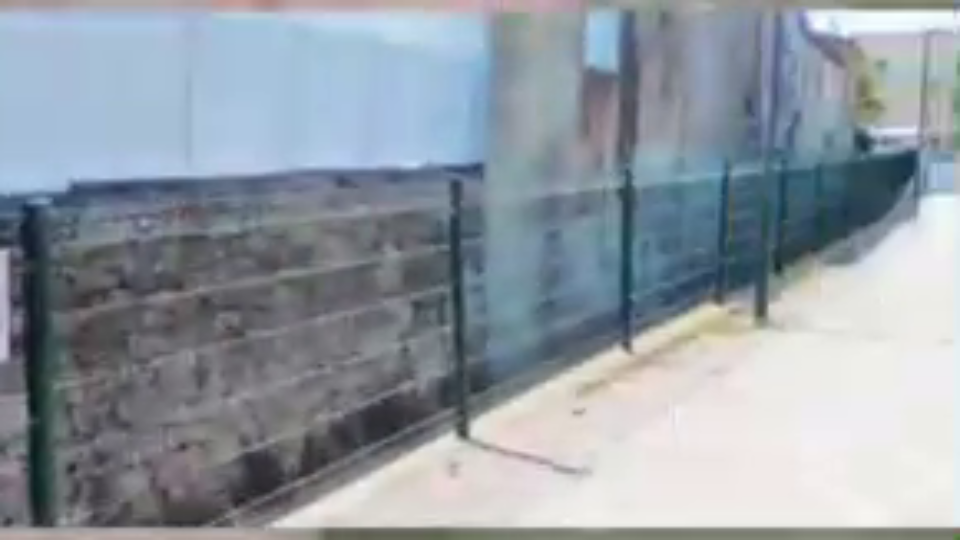

📍 Frame 540


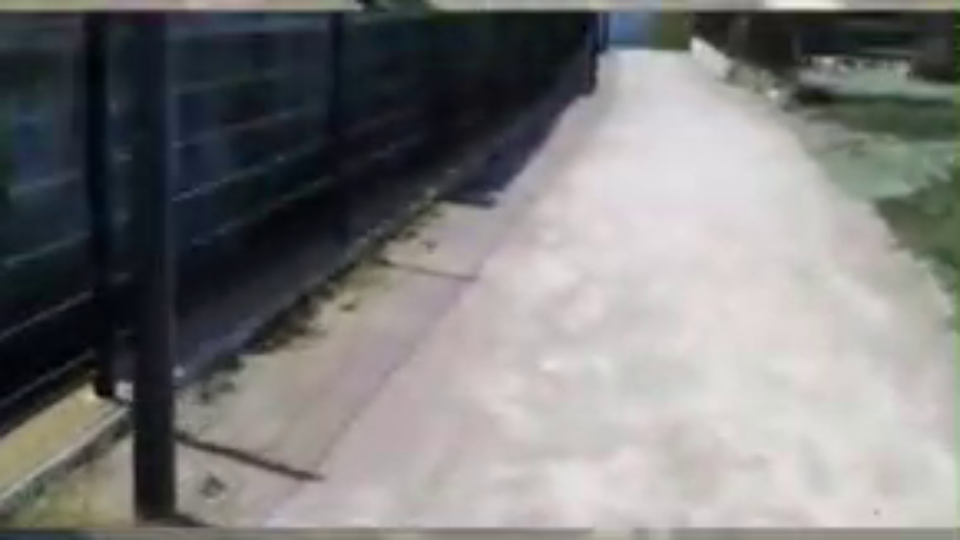

📍 Frame 600


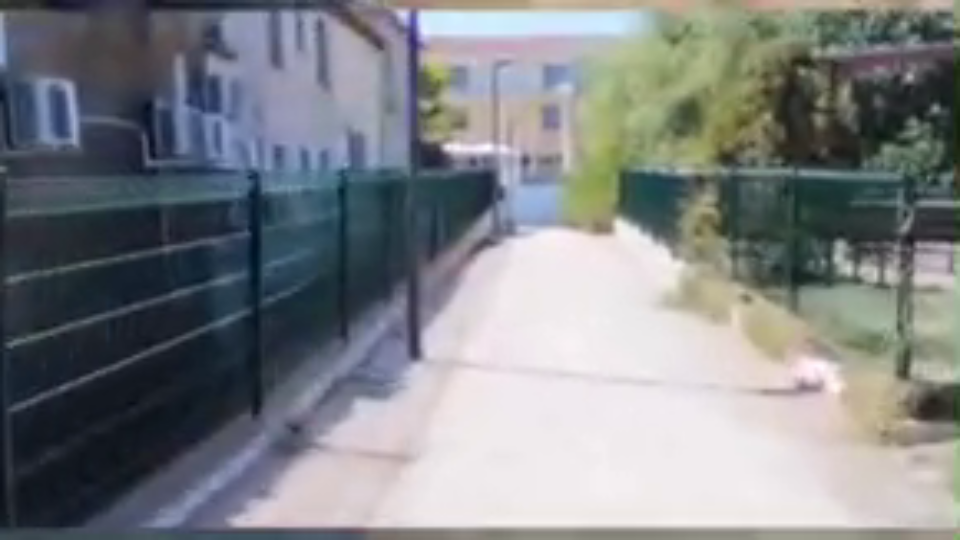

📍 Frame 660


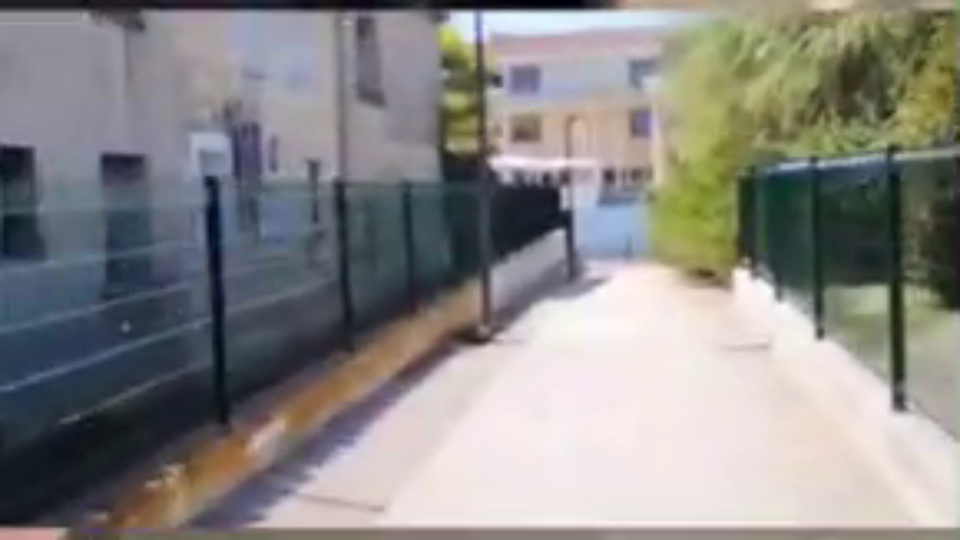

📍 Frame 720


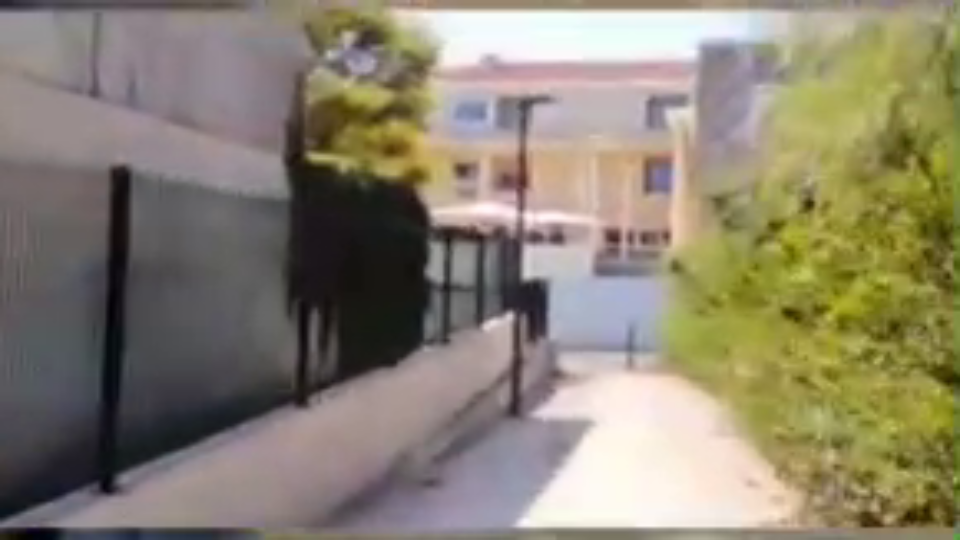

[Frame 759] 🔊 Pole devant vous à 1 pas ! Contournez par la DROITE, 1 pas.
📍 Frame 780


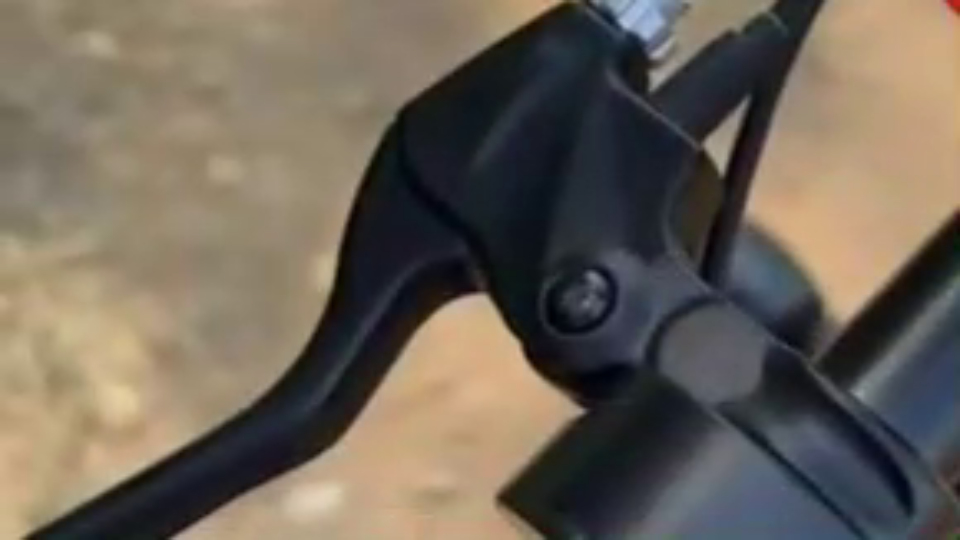

[Frame 822] 🔊 Tree devant vous à 2 pas ! Contournez par la DROITE, 2 pas.
[Frame 827] 🔊 Warning Column devant vous à 2 pas ! Contournez par la DROITE, 0 pas.
[Frame 837] 🔊 Pole devant vous à 2 pas ! Contournez par la DROITE, 0 pas.
📍 Frame 840


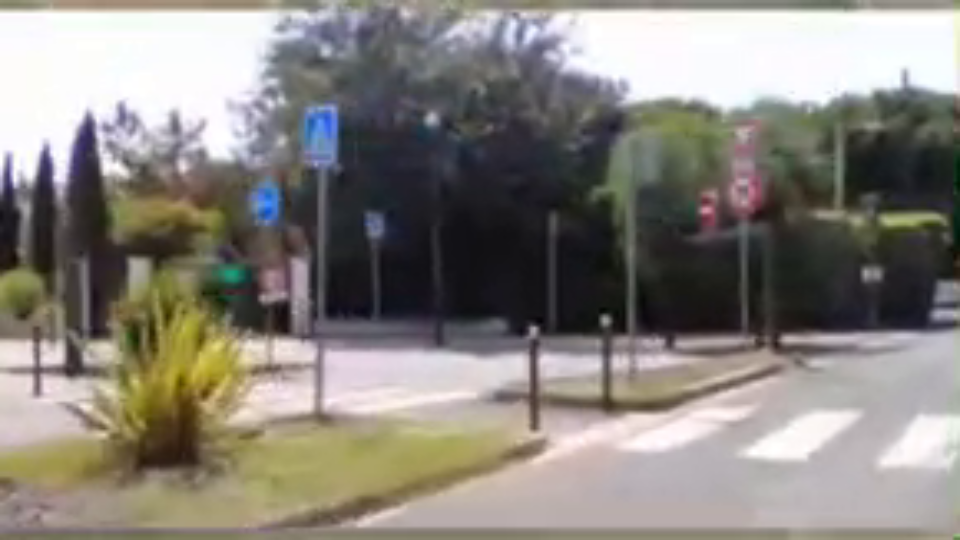

[Frame 890] 🔊 Pole devant vous à 1 pas ! Contournez par la DROITE, 2 pas.
[Frame 892] 🔊 Passage piéton à gauche à 5 pas. Route dégagée. Vous pouvez traverser.

✅ Terminé ! Vidéo : resultat_20260111_181853.mp4

💾 Pour télécharger :
   from google.colab import files
   files.download('resultat_20260111_181853.mp4')


In [ ]:
from datetime import datetime
import time
import cv2
from ultralytics import YOLO
import numpy as np
from collections import defaultdict
import math
import threading
from queue import Queue

# Détection environnement Colab
try:
    from google.colab.patches import cv2_imshow
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

# ============ CATEGORIES DÉTAILLÉES ============
CATEGORIES = {
    # Véhicules motorisés (danger élevé, mouvement rapide)
    "car": {"type": "A", "mobile": True, "vitesse_type": "rapide", "danger_base": 0.95},
    "bus": {"type": "A", "mobile": True, "vitesse_type": "rapide", "danger_base": 0.95},
    "truck": {"type": "A", "mobile": True, "vitesse_type": "rapide", "danger_base": 0.95},
    "motorcycle": {"type": "A", "mobile": True, "vitesse_type": "rapide", "danger_base": 0.90},

    # Véhicules non motorisés (danger moyen, mouvement modéré)
    "bicycle": {"type": "B", "mobile": True, "vitesse_type": "modere", "danger_base": 0.70},
    "tricycle": {"type": "B", "mobile": True, "vitesse_type": "lent", "danger_base": 0.60},

    # Obstacles fixes sur la voie (danger collision)
    "pole": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.75},
    "tree": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.75},
    "fire_hydrant": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.70},
    "warning_column": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.70},
    "roadblock": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.80},
    "ashcan": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.65},
    "reflective_cone": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.60},

    # Éléments de navigation (information importante)
    "crosswalk": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.30},
    "blind_road": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.20},
    "sign": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.25},
    "red_light": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.90},
    "green_light": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.20},

    # Êtres vivants (comportement imprévisible)
    "person": {"type": "E", "mobile": True, "vitesse_type": "lent", "danger_base": 0.60},
    "dog": {"type": "E", "mobile": True, "vitesse_type": "modere", "danger_base": 0.50},

    # Mobilier urbain
    "chair": {"type": "F", "mobile": False, "contournable": "oui", "danger_base": 0.50},
    "bench": {"type": "F", "mobile": False, "contournable": "oui", "danger_base": 0.65},
}

# ============ CONFIGURATION ============
CONFIDENCE_THRESHOLD = 0.65
CAMERA_HEIGHT = 1.5
CAMERA_FOV = 60

# ============ TRACKER ============
class ObjectTracker:
    def __init__(self, max_age=10):
        self.tracked_objects = {}
        self.next_id = 0
        self.max_age = max_age

    def update(self, detections):
        current_frame_ids = set()
        for det in detections:
            bbox = det['bbox']
            class_name = det['class_name']
            matched_id = self._find_match(bbox, class_name)
            if matched_id is not None:
                self.tracked_objects[matched_id]['positions'].append(bbox)
                self.tracked_objects[matched_id]['age'] = 0
                self.tracked_objects[matched_id]['last_seen'] = det
                current_frame_ids.add(matched_id)
            else:
                self.tracked_objects[self.next_id] = {
                    'class_name': class_name,
                    'positions': [bbox],
                    'age': 0,
                    'last_seen': det
                }
                current_frame_ids.add(self.next_id)
                self.next_id += 1

        # Vieillir objets non vus
        for obj_id in list(self.tracked_objects.keys()):
            if obj_id not in current_frame_ids:
                self.tracked_objects[obj_id]['age'] += 1
                if self.tracked_objects[obj_id]['age'] > self.max_age:
                    del self.tracked_objects[obj_id]

    def _find_match(self, bbox, class_name):
        x1, y1, x2, y2 = bbox
        center = ((x1 + x2) / 2, (y1 + y2) / 2)
        best_match = None
        min_distance = float('inf')
        for obj_id, obj in self.tracked_objects.items():
            if obj['class_name'] != class_name:
                continue
            last_bbox = obj['positions'][-1]
            lx1, ly1, lx2, ly2 = last_bbox
            last_center = ((lx1 + lx2) / 2, (ly1 + ly2) / 2)
            distance = math.sqrt((center[0]-last_center[0])**2 + (center[1]-last_center[1])**2)
            if distance < min_distance and distance < 100:
                min_distance = distance
                best_match = obj_id
        return best_match

    def get_velocity(self, obj_id):
        if obj_id not in self.tracked_objects:
            return 0, 0
        positions = self.tracked_objects[obj_id]['positions']
        if len(positions) < 2:
            return 0, 0
        recent = positions[-5:]
        x1_start, y1_start, x2_start, y2_start = recent[0]
        x1_end, y1_end, x2_end, y2_end = recent[-1]
        center_start = ((x1_start + x2_start)/2, (y1_start+y2_start)/2)
        center_end = ((x1_end + x2_end)/2, (y1_end+y2_end)/2)
        vx = (center_end[0]-center_start[0])/len(recent)
        vy = (center_end[1]-center_start[1])/len(recent)
        return vx, vy

# ============ DISTANCE ============
def estimer_distance_reelle(bbox, frame_height):
    x1, y1, x2, y2 = bbox
    bottom_y = y2
    normalized_y = bottom_y / frame_height
    if normalized_y > 0.85: return 1.0
    elif normalized_y > 0.70: return 2.0
    elif normalized_y > 0.55: return 3.5
    elif normalized_y > 0.40: return 6.0
    else: return 10.0

def distance_en_pas(distance_m):
    return int(distance_m / 0.7)

# ============ DIRECTION ============
def analyser_direction_detaillee(bbox, frame_width):
    x1, _, x2, _ = bbox
    centre_x = (x1 + x2)/2
    position = centre_x / frame_width
    if position < 0.25: return "très à gauche", "gauche", 2
    elif position < 0.40: return "à gauche", "gauche", 1
    elif position < 0.60: return "devant vous", "devant", 0
    elif position < 0.75: return "à droite", "droite", 1
    else: return "très à droite", "droite", 2

# ============ VOIX ENGINE ============
class VoiceEngine:
    def __init__(self, activer=True, vitesse=180, volume=1.0):
        self.activer = activer and not IN_COLAB
        self.message_queue = Queue()
        self.engine = None
        self.thread = None

        if not self.activer:
            return

        try:
            import pyttsx3
            self.engine = pyttsx3.init()
            self.engine.setProperty('rate', vitesse)
            self.engine.setProperty('volume', volume)
            voices = self.engine.getProperty('voices')
            for voice in voices:
                if 'french' in voice.name.lower() or 'fr' in voice.id.lower():
                    self.engine.setProperty('voice', voice.id)
                    break
            self.thread = threading.Thread(target=self._worker, daemon=True)
            self.thread.start()
            print("🔊 Moteur vocal activé")
        except Exception as e:
            print(f"⚠️ Synthèse vocale désactivée: {e}")
            self.activer = False

    def _worker(self):
        while True:
            message = self.message_queue.get()
            if message is None:
                break
            try:
                self.engine.stop()
                self.engine.say(message)
                self.engine.runAndWait()
            except:
                pass
            finally:
                self.message_queue.task_done()

    def parler(self, message, priorite='moyenne'):
        if not self.activer:
            return
        if priorite in ['critique', 'haute']:
            while not self.message_queue.empty():
                try:
                    self.message_queue.get_nowait()
                    self.message_queue.task_done()
                except:
                    break
        if self.message_queue.qsize() < 3:
            self.message_queue.put(message)

    def stop(self):
        if self.activer and self.thread:
            self.message_queue.put(None)
            self.thread.join(timeout=2)

# ============ ASSISTANT ============
class VoiceAssistant:
    def __init__(self):
        self.cooldown = {}
        self.last_crosswalk_time = 0
        self.last_crosswalk_state = None
        self.crosswalk_cooldown = 3.0

    def generer_instruction(self, analyse, obj_id, instructions=[]):
        current_time = time.time()
        key = f"{obj_id}_{analyse['objet']}"

        # Cooldown basique
        if key in self.cooldown:
            elapsed = current_time - self.cooldown[key]
            if elapsed < 1.5:  # Cooldown général
                return None

        obj = analyse['objet']
        pas = analyse['pas']
        direction_text = analyse['direction_text']
        direction_simple = analyse['direction_simple']
        pas_evitement = analyse['pas_evitement']
        evitement = analyse['direction_evitement']

        info = CATEGORIES.get(obj, {})
        priorite = 'moyenne'
        message = ""

        # === CROSSWALK ===
        if obj == 'crosswalk':
            safe = evaluer_securite_passage_pieton(analyse, instructions)
            state_changed = (safe != self.last_crosswalk_state)

            if not state_changed and (current_time - self.last_crosswalk_time < self.crosswalk_cooldown):
                return None

            self.last_crosswalk_state = safe
            self.last_crosswalk_time = current_time

            if safe:
                message = f"Passage piéton {direction_text} à {pas} pas. Route dégagée. Vous pouvez traverser."
                priorite = 'haute'
            else:
                message = f"Attention ! Passage piéton {direction_text} à {pas} pas. Traversée dangereuse. Attendez."
                priorite = 'critique'

        # === FEUX ===
        elif obj == 'green_light':
            if pas < 10:
                message = f"STOP ! Feu vert pour voitures. N'avancez pas."
                priorite = 'critique'
            else:
                return None

        elif obj == 'red_light':
            if pas < 10:
                message = f"Feu rouge pour voitures. Vous pouvez traverser prudemment."
                priorite = 'haute'
            else:
                return None

        # === VÉHICULES ===
        elif info.get('type') == 'A':
            if analyse['sur_trajectoire']:
                if analyse['vitesse'] == 'rapide':
                    message = f"DANGER ! {obj.title()} {direction_text} à {pas} pas. Se rapproche rapidement. STOP !"
                    priorite = 'critique'
                else:
                    message = f"Attention, {obj} {direction_text} à {pas} pas. Attendez."
                    priorite = 'haute'
            else:
                if pas < 5:
                    message = f"{obj.title()} {direction_text} à {pas} pas."
                    priorite = 'moyenne'
                else:
                    return None

        # === OBSTACLES FIXES ===
        elif info.get('type') == 'C':
            if pas < 4:
                message = f"{obj.replace('_', ' ').title()} devant vous à {pas} pas ! Contournez par la {evitement.upper()}, {pas_evitement} pas."
                priorite = 'haute'
            else:
                return None

        # === PERSONNES ===
        elif obj == 'person':
            if analyse['sur_trajectoire'] and pas < 4:
                message = f"Personne devant vous à {pas} pas. Ralentissez."
                priorite = 'haute'
            elif pas < 2:
                message = f"Personne très proche {direction_text}."
                priorite = 'haute'
            elif pas < 5:
                message = f"Personne {direction_text} à {pas} pas."
                priorite = 'moyenne'
            else:
                return None

        # === VÉLOS ===
        elif obj == 'bicycle':
            if analyse['sur_trajectoire'] and analyse['vitesse'] != 'immobile':
                message = f"Vélo {direction_text} à {pas} pas. Il se déplace. Attendez."
                priorite = 'haute'
            elif pas < 4:
                message = f"Vélo {direction_text} à {pas} pas."
                priorite = 'moyenne'
            else:
                return None

        # === DÉFAUT ===
        else:
            if pas < 3:
                message = f"Obstacle {direction_text} à {pas} pas."
                priorite = 'moyenne'
            else:
                return None

        if message:
            self.cooldown[key] = current_time
            return {'message': message, 'priorite': priorite, 'doit_parler': True}
        return None

# ============ SÉCURITÉ CROSSWALK ============
def evaluer_securite_passage_pieton(crosswalk_analyse, instructions):
    """Évalue si c'est sûr de traverser au passage piéton"""
    for inst in instructions:
        obj = inst['objet']
        info = CATEGORIES.get(obj, {})

        # Véhicule proche et sur trajectoire
        if info.get('type') == 'A' and inst['distance_m'] <= 10 and inst['sur_trajectoire']:
            return False

        # Feu rouge proche
        if obj == 'red_light' and inst['distance_m'] <= 5:
            return False

    return True

# ============ ANALYSE SCENE ============
def analyser_scene_complete(detections, tracker, frame_width, frame_height, voice_assistant):
    instructions = []
    tracker.update(detections)

    for det in detections:
        bbox = det['bbox']
        class_name = det['class_name']
        conf = det['confidence']
        info = CATEGORIES.get(class_name, {})

        distance_m = estimer_distance_reelle(bbox, frame_height)
        pas = distance_en_pas(distance_m)
        direction_text, direction_simple, pas_evitement = analyser_direction_detaillee(bbox, frame_width)

        # Trouver l'ID de tracking
        obj_id = None
        for tid, tobj in tracker.tracked_objects.items():
            if tobj['last_seen']['bbox'] == bbox:
                obj_id = tid
                break

        # Vitesse
        vx, vy = 0, 0
        vitesse_categorie = 'immobile'
        sur_trajectoire = False

        if info.get('mobile', False) and obj_id is not None:
            vx, vy = tracker.get_velocity(obj_id)
            vitesse_mag = math.sqrt(vx**2 + vy**2)
            if vitesse_mag > 15:
                vitesse_categorie = 'rapide'
            elif vitesse_mag > 5:
                vitesse_categorie = 'modere'
            elif vitesse_mag > 1:
                vitesse_categorie = 'lent'
            if vy > 2:
                sur_trajectoire = True

        direction_evitement = 'gauche' if direction_simple == 'droite' else 'droite'

        analyse = {
            'objet': class_name,
            'confidence': conf,
            'bbox': bbox,
            'distance_m': distance_m,
            'pas': pas,
            'direction_text': direction_text,
            'direction_simple': direction_simple,
            'direction_evitement': direction_evitement,
            'pas_evitement': pas_evitement,
            'vitesse': vitesse_categorie,
            'sur_trajectoire': sur_trajectoire,
            'mobile': info.get('mobile', False),
            'priorite': 'moyenne'
        }

        instruction = voice_assistant.generer_instruction(analyse, obj_id or hash(str(bbox)), instructions)
        if instruction:
            analyse.update(instruction)
            instructions.append(analyse)

    # Garder seulement le crosswalk le plus proche
    crosswalks = [inst for inst in instructions if inst['objet'] == 'crosswalk']
    if len(crosswalks) > 1:
        closest = min(crosswalks, key=lambda x: x['distance_m'])
        instructions = [inst for inst in instructions if inst['objet'] != 'crosswalk']
        instructions.append(closest)

    # Trier par priorité puis distance
    priority_order = {'critique': 0, 'haute': 1, 'moyenne': 2, 'info': 3}
    instructions.sort(key=lambda x: (priority_order.get(x['priorite'], 4), x['pas']))

    return instructions

# ============ TRAITEMENT VIDÉO ============
def traiter_video(video_path, model_path, output_path, afficher=True, vocal=False, vitesse_voix=180):
    print("🔄 Initialisation...")
    yolo_model = YOLO(model_path)
    tracker = ObjectTracker(max_age=15)
    voice_assistant = VoiceAssistant()
    voice_engine = VoiceEngine(activer=vocal, vitesse=vitesse_voix)

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"❌ Impossible d'ouvrir : {video_path}")
        return

    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    COLORS = {
        'critique': (0, 0, 255),
        'haute': (0, 140, 255),
        'moyenne': (0, 255, 255),
        'info': (255, 255, 255)
    }

    frame_count = 0
    print("🚀 Traitement en cours...\n")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1

        # Détection YOLO
        results = yolo_model(frame, verbose=False, conf=CONFIDENCE_THRESHOLD)

        # Préparer détections
        detections = []
        for result in results:
            for box in result.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                conf = float(box.conf[0])
                cls = int(box.cls[0])
                class_name = yolo_model.names[cls]

                if class_name in CATEGORIES:
                    detections.append({
                        'bbox': (x1, y1, x2, y2),
                        'confidence': conf,
                        'class_name': class_name
                    })

        # Analyse complète
        instructions = analyser_scene_complete(detections, tracker, frame_width, frame_height, voice_assistant)

        # Affichage (max 5 messages)
        y_offset = 30
        messages_prononces = 0

        for inst in instructions[:5]:
            if inst.get('doit_parler', False):
                color = COLORS.get(inst['priorite'], (255, 255, 255))
                message = inst['message']

                # Afficher à l'écran
                cv2.putText(frame, message, (10, y_offset),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
                y_offset += 30

                # Bbox
                bbox = inst['bbox']
                cv2.rectangle(frame, (bbox[0], bbox[1]), (bbox[2], bbox[3]), color, 3)

                # Prononcer (max 2 par frame, priorité haute/critique seulement)
                if inst['priorite'] in ['critique', 'haute'] and messages_prononces < 2:
                    message_propre = message.replace('⚠️', '').replace('🚦', '').replace('✅', '').strip()
                    voice_engine.parler(message_propre, inst['priorite'])
                    messages_prononces += 1
                    print(f"[Frame {frame_count}] 🔊 {message_propre}")

        out.write(frame)

        # Affichage selon environnement
        if afficher and not IN_COLAB:
            display = cv2.resize(frame, (1280, 720))
            cv2.imshow('Assistant Non-Voyant', display)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
        elif IN_COLAB and frame_count % 60 == 0:
            print(f"📍 Frame {frame_count}")
            display = cv2.resize(frame, (960, 540))
            cv2_imshow(display)

    cap.release()
    out.release()
    if not IN_COLAB:
        cv2.destroyAllWindows()
    voice_engine.stop()

    print(f"\n✅ Terminé ! Vidéo : {output_path}")

    if IN_COLAB:
        print(f"\n💾 Pour télécharger :")
        print(f"   from google.colab import files")
        print(f"   files.download('{output_path}')")

# ============ MAIN ============
if __name__ == "__main__":
    import os

    VIDEO_PATH = "/content/video1.mp4"
    MODEL_PATH = "/content/assistive_yolo_best.pt"
    OUTPUT_PATH = "resultat_" + datetime.now().strftime("%Y%m%d_%H%M%S") + ".mp4"

    ACTIVER_VOIX = False
    VITESSE_VOIX = 180

    print("="*60)
    print("🦯 ASSISTANT VOCAL POUR NON-VOYANT")
    print("="*60)
    print(f"🔊 Synthèse vocale : {'ACTIVÉE' if ACTIVER_VOIX else 'DÉSACTIVÉE'}")
    print(f"⚡ Vitesse de parole : {VITESSE_VOIX}")
    print(f"📱 Environnement : {'Google Colab' if IN_COLAB else 'Local'}")
    print("="*60 + "\n")

    if not os.path.exists(VIDEO_PATH):
        print(f"❌ Vidéo introuvable : {VIDEO_PATH}")
        exit(1)

    if not os.path.exists(MODEL_PATH):
        print(f"❌ Modèle introuvable : {MODEL_PATH}")
        exit(1)

    traiter_video(VIDEO_PATH, MODEL_PATH, OUTPUT_PATH, afficher=True, vocal=ACTIVER_VOIX, vitesse_voix=VITESSE_VOIX)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🦯 ASSISTANT VOCAL POUR NON-VOYANT
🔊 Synthèse vocale : DÉSACTIVÉE
⚡ Vitesse de parole : 180
📱 Environnement : Google Colab

🔄 Initialisation...
🚀 Traitement en cours...

📍 Frame 60


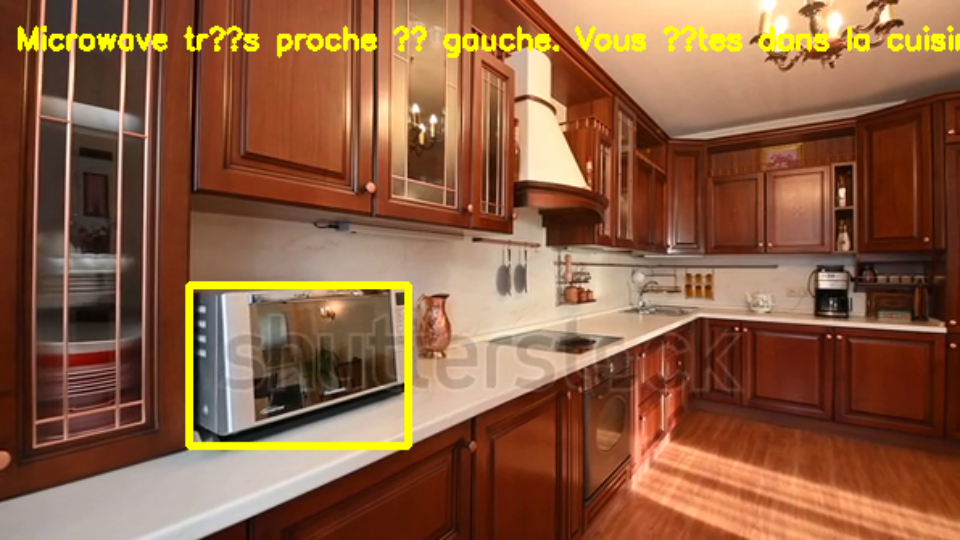

📍 Frame 120


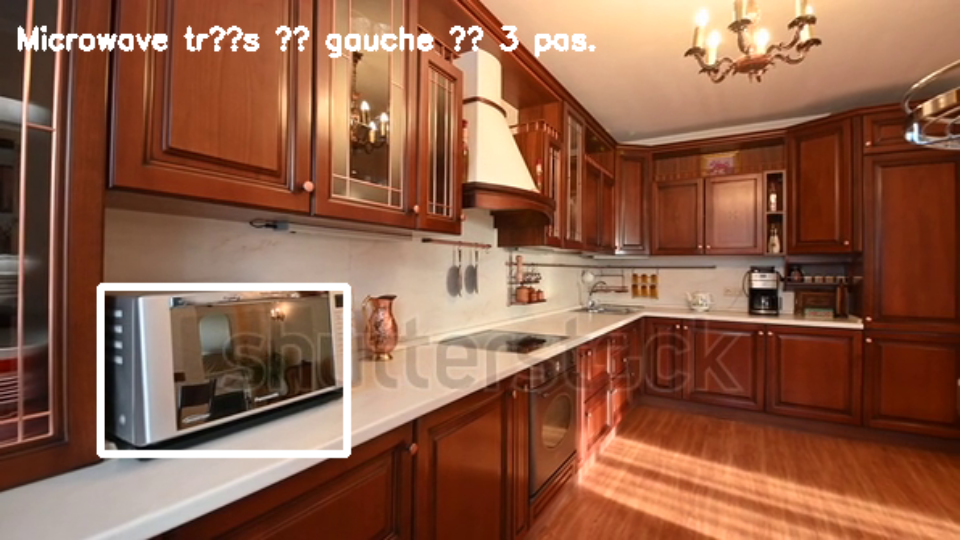

📍 Frame 180


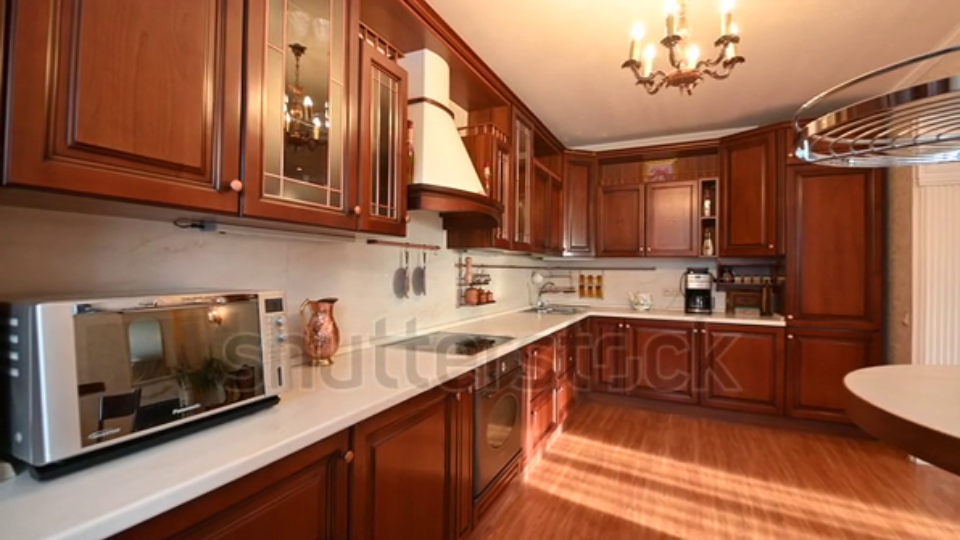


✅ Terminé ! Vidéo : /content/resultat_20260116_220740.mp4

💾 Pour télécharger :
   from google.colab import files
   files.download('/content/resultat_20260116_220740.mp4')


In [3]:
from datetime import datetime
import time
import cv2
from ultralytics import YOLO
import numpy as np
from collections import defaultdict
import math
import threading
from queue import Queue

# Détection environnement Colab
try:
    from google.colab.patches import cv2_imshow
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

# ============ CATEGORIES DÉTAILLÉES ============
CATEGORIES = {
    # Véhicules motorisés (danger élevé, mouvement rapide)
    "car": {"type": "A", "mobile": True, "vitesse_type": "rapide", "danger_base": 0.95},
    "bus": {"type": "A", "mobile": True, "vitesse_type": "rapide", "danger_base": 0.95},
    "truck": {"type": "A", "mobile": True, "vitesse_type": "rapide", "danger_base": 0.95},
    "motorcycle": {"type": "A", "mobile": True, "vitesse_type": "rapide", "danger_base": 0.90},

    # Véhicules non motorisés (danger moyen, mouvement modéré)
    "bicycle": {"type": "B", "mobile": True, "vitesse_type": "modere", "danger_base": 0.70},
    "tricycle": {"type": "B", "mobile": True, "vitesse_type": "lent", "danger_base": 0.60},

    # Obstacles fixes sur la voie (danger collision)
    "pole": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.75},
    "tree": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.75},
    "fire_hydrant": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.70},
    "warning_column": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.70},
    "roadblock": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.80},
    "ashcan": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.65},
    "reflective_cone": {"type": "C", "mobile": False, "contournable": "oui", "danger_base": 0.60},

    # Éléments de navigation (information importante)
    "crosswalk": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.30},
    "blind_road": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.20},
    "sign": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.25},
    "red_light": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.90},
    "green_light": {"type": "D", "mobile": False, "navigation": True, "danger_base": 0.20},

    # Êtres vivants (comportement imprévisible - UNIVERSEL : intérieur ET extérieur)
    "person": {"type": "E", "mobile": True, "vitesse_type": "lent", "danger_base": 0.60, "universel": True},
    "dog": {"type": "E", "mobile": True, "vitesse_type": "modere", "danger_base": 0.50, "universel": True},

    # Mobilier urbain extérieur
    "chair": {"type": "F", "mobile": False, "contournable": "oui", "danger_base": 0.50},
    "bench": {"type": "F", "mobile": False, "contournable": "oui", "danger_base": 0.65},

    # ===== OBJETS D'INTÉRIEUR =====
    # Mobilier (obstacles de taille moyenne à grande)
    "couch": {"type": "G", "mobile": False, "interieur": True, "taille": "grand", "danger_base": 0.70},
    "bed": {"type": "G", "mobile": False, "interieur": True, "taille": "grand", "danger_base": 0.65},
    "dining table": {"type": "G", "mobile": False, "interieur": True, "taille": "moyen", "danger_base": 0.60},
    "toilet": {"type": "G", "mobile": False, "interieur": True, "taille": "moyen", "danger_base": 0.60},

    # Plantes et décoration (obstacles moyens)
    "potted plant": {"type": "H", "mobile": False, "interieur": True, "taille": "petit", "danger_base": 0.55},
    "vase": {"type": "H", "mobile": False, "interieur": True, "taille": "petit", "danger_base": 0.45, "fragile": True},

    # Électroménager (repères utiles en cuisine)
    "microwave": {"type": "I", "mobile": False, "interieur": True, "piece": "cuisine", "danger_base": 0.30},
    "oven": {"type": "I", "mobile": False, "interieur": True, "piece": "cuisine", "danger_base": 0.40},
    "toaster": {"type": "I", "mobile": False, "interieur": True, "piece": "cuisine", "danger_base": 0.25},
    "sink": {"type": "I", "mobile": False, "interieur": True, "piece": "cuisine/sdb", "danger_base": 0.35},
    "refrigerator": {"type": "I", "mobile": False, "interieur": True, "taille": "grand", "piece": "cuisine", "danger_base": 0.75},

    # Électronique (repères utiles)
    "tv": {"type": "J", "mobile": False, "interieur": True, "piece": "salon", "danger_base": 0.20},
    "laptop": {"type": "J", "mobile": True, "interieur": True, "taille": "petit", "danger_base": 0.15},

    # Petits objets (peu dangereux mais utiles comme repères)
    "book": {"type": "K", "mobile": True, "interieur": True, "taille": "petit", "danger_base": 0.10},
    "clock": {"type": "K", "mobile": False, "interieur": True, "taille": "petit", "danger_base": 0.10},
}

# ============ MODE ENVIRONNEMENT ============
MODE_EXTERIEUR = ["A", "B", "C", "D", "E", "F"]  # Types pertinents dehors
MODE_INTERIEUR = ["G", "H", "I", "J", "K"]       # Types pertinents dedans

def detecter_mode_environnement(detections):
    """Détecte si on est à l'intérieur ou à l'extérieur"""
    score_exterieur = 0
    score_interieur = 0

    for det in detections:
        class_name = det['class_name']
        info = CATEGORIES.get(class_name, {})
        type_obj = info.get('type', '')

        # Ignorer les objets universels (personnes, animaux)
        if info.get('universel', False):
            continue

        if type_obj in MODE_EXTERIEUR:
            score_exterieur += 1
        if type_obj in MODE_INTERIEUR:
            score_interieur += 1

    # Si beaucoup d'objets d'intérieur, on est dedans
    if score_interieur >= 2:
        return "interieur"
    elif score_exterieur >= 2:
        return "exterieur"
    else:
        return "mixte"  # Près d'une porte, terrasse, etc.

# ============ CONFIGURATION ============
CONFIDENCE_THRESHOLD = 0.65
CAMERA_HEIGHT = 1.5
CAMERA_FOV = 60

# ============ TRACKER ============
class ObjectTracker:
    def __init__(self, max_age=10):
        self.tracked_objects = {}
        self.next_id = 0
        self.max_age = max_age

    def update(self, detections):
        current_frame_ids = set()
        for det in detections:
            bbox = det['bbox']
            class_name = det['class_name']
            matched_id = self._find_match(bbox, class_name)
            if matched_id is not None:
                self.tracked_objects[matched_id]['positions'].append(bbox)
                self.tracked_objects[matched_id]['age'] = 0
                self.tracked_objects[matched_id]['last_seen'] = det
                current_frame_ids.add(matched_id)
            else:
                self.tracked_objects[self.next_id] = {
                    'class_name': class_name,
                    'positions': [bbox],
                    'age': 0,
                    'last_seen': det
                }
                current_frame_ids.add(self.next_id)
                self.next_id += 1

        # Vieillir objets non vus
        for obj_id in list(self.tracked_objects.keys()):
            if obj_id not in current_frame_ids:
                self.tracked_objects[obj_id]['age'] += 1
                if self.tracked_objects[obj_id]['age'] > self.max_age:
                    del self.tracked_objects[obj_id]

    def _find_match(self, bbox, class_name):
        x1, y1, x2, y2 = bbox
        center = ((x1 + x2) / 2, (y1 + y2) / 2)
        best_match = None
        min_distance = float('inf')
        for obj_id, obj in self.tracked_objects.items():
            if obj['class_name'] != class_name:
                continue
            last_bbox = obj['positions'][-1]
            lx1, ly1, lx2, ly2 = last_bbox
            last_center = ((lx1 + lx2) / 2, (ly1 + ly2) / 2)
            distance = math.sqrt((center[0]-last_center[0])**2 + (center[1]-last_center[1])**2)
            if distance < min_distance and distance < 100:
                min_distance = distance
                best_match = obj_id
        return best_match

    def get_velocity(self, obj_id):
        if obj_id not in self.tracked_objects:
            return 0, 0
        positions = self.tracked_objects[obj_id]['positions']
        if len(positions) < 2:
            return 0, 0
        recent = positions[-5:]
        x1_start, y1_start, x2_start, y2_start = recent[0]
        x1_end, y1_end, x2_end, y2_end = recent[-1]
        center_start = ((x1_start + x2_start)/2, (y1_start+y2_start)/2)
        center_end = ((x1_end + x2_end)/2, (y1_end+y2_end)/2)
        vx = (center_end[0]-center_start[0])/len(recent)
        vy = (center_end[1]-center_start[1])/len(recent)
        return vx, vy

# ============ DISTANCE ============
def estimer_distance_reelle(bbox, frame_height, mode_environnement="exterieur"):
    x1, y1, x2, y2 = bbox
    bottom_y = y2
    normalized_y = bottom_y / frame_height
    if mode_environnement == "interieur":
        # 🌟 Estimation pour intérieur (pièces, mobilier)
        if normalized_y > 0.85:
            return 0.5   # très proche
        elif normalized_y > 0.70:
            return 1.0
        elif normalized_y > 0.55:
            return 1.8
        elif normalized_y > 0.40:
            return 3.0
        else:
            return 5.0   # loin mais dans la pièce
    else:
        # 🌟 Estimation pour extérieur (rue, trottoir)
        if normalized_y > 0.85:
            return 1.0
        elif normalized_y > 0.70:
            return 2.0
        elif normalized_y > 0.55:
            return 3.5
        elif normalized_y > 0.40:
            return 6.0
        else:
            return 10.0

def distance_en_pas(distance_m):
    """
    ❌ CORRIGÉ : Arrondi au lieu de int() pour éviter sous-estimation
    """
    return max(1, round(distance_m / 0.7))

# ============ DIRECTION ============
def analyser_direction_detaillee(bbox, frame_width):
    x1, _, x2, _ = bbox
    centre_x = (x1 + x2)/2
    position = centre_x / frame_width
    if position < 0.25: return "très à gauche", "gauche", 2
    elif position < 0.40: return "à gauche", "gauche", 1
    elif position < 0.60: return "devant vous", "devant", 0
    elif position < 0.75: return "à droite", "droite", 1
    else: return "très à droite", "droite", 2

# ============ VOIX ENGINE ============
class VoiceEngine:
    def __init__(self, activer=True, vitesse=180, volume=1.0):
        self.activer = activer and not IN_COLAB
        self.message_queue = Queue()
        self.engine = None
        self.thread = None

        if not self.activer:
            return

        try:
            import pyttsx3
            self.engine = pyttsx3.init()
            self.engine.setProperty('rate', vitesse)
            self.engine.setProperty('volume', volume)
            voices = self.engine.getProperty('voices')
            for voice in voices:
                if 'french' in voice.name.lower() or 'fr' in voice.id.lower():
                    self.engine.setProperty('voice', voice.id)
                    break
            self.thread = threading.Thread(target=self._worker, daemon=True)
            self.thread.start()
            print("🔊 Moteur vocal activé")
        except Exception as e:
            print(f"⚠️ Synthèse vocale désactivée: {e}")
            self.activer = False

    def _worker(self):
        while True:
            message = self.message_queue.get()
            if message is None:
                break
            try:
                self.engine.stop()
                self.engine.say(message)
                self.engine.runAndWait()
            except:
                pass
            finally:
                self.message_queue.task_done()

    def parler(self, message, priorite='moyenne'):
        if not self.activer:
            return
        if priorite in ['critique', 'haute']:
            while not self.message_queue.empty():
                try:
                    self.message_queue.get_nowait()
                    self.message_queue.task_done()
                except:
                    break
        if self.message_queue.qsize() < 3:
            self.message_queue.put(message)

    def stop(self):
        if self.activer and self.thread:
            self.message_queue.put(None)
            self.thread.join(timeout=2)

# ============ ASSISTANT ============
class VoiceAssistant:
    def __init__(self):
        self.cooldown = {}
        self.frame_counter = 0
        self.last_crosswalk_time = 0
        self.last_crosswalk_state = None
        self.crosswalk_cooldown = 3.0
        self.mode_environnement = "exterieur"
        self.last_object_state = {}  # Mémoriser l'état de chaque objet

    def generer_instruction(self, analyse, obj_id, instructions=None, mode="exterieur"):
        """
        ❌ CORRIGÉ : instructions=[] → instructions=None (évite bug mutable)
        """
        if instructions is None:
            instructions = []

        current_time = time.time()
        self.frame_counter += 1

        obj = analyse['objet']
        pas = analyse['pas']
        direction_text = analyse['direction_text']
        direction_simple = analyse['direction_simple']
        pas_evitement = analyse['pas_evitement']
        evitement = analyse['direction_evitement']

        info = CATEGORIES.get(obj, {})

        # Cooldown adaptatif selon priorité
        cooldown_secondes = {
            'critique': 0.5,
            'haute': 1.5,
            'moyenne': 3.0,
            'info': 5.0
        }

        key = f"{obj_id}_{obj}"

        # Détection de changement d'état
        current_state = {
            'distance': pas,
            'direction': direction_simple,
            'sur_trajectoire': analyse.get('sur_trajectoire', False),
            'vitesse': analyse.get('vitesse', 'immobile')
        }

        state_changed = False
        if key in self.last_object_state:
            old_state = self.last_object_state[key]
            # Changement significatif de distance
            if abs(old_state['distance'] - current_state['distance']) >= 2:
                state_changed = True
            # Changement de direction
            if old_state['direction'] != current_state['direction']:
                state_changed = True
            # Changement sur trajectoire
            if old_state['sur_trajectoire'] != current_state['sur_trajectoire']:
                state_changed = True
            # Changement de vitesse
            if old_state['vitesse'] != current_state['vitesse']:
                state_changed = True
        else:
            state_changed = True  # Premier passage

        # Vérifier cooldown seulement si pas de changement d'état
        if key in self.cooldown:
            elapsed = current_time - self.cooldown[key]

            # Déterminer la priorité pour le cooldown
            if state_changed:
                # Si état a changé, utiliser un cooldown minimum de 1 sec quand même
                required_cooldown = 1.0
            else:
                # Sinon, utiliser le cooldown complet selon la priorité
                priorite_estimee = 'haute' if pas < 3 else 'moyenne'
                required_cooldown = cooldown_secondes.get(priorite_estimee, 5.0)

            if elapsed < required_cooldown:
                return None

        # Mettre à jour l'état SEULEMENT si on va générer un message
        self.last_object_state[key] = current_state

        priorite = 'moyenne'
        message = ""

        # === OBJETS D'INTÉRIEUR ===
        if info.get('interieur', False):
            result = self._traiter_objet_interieur(obj, info, analyse)
            if result is None:
                return None
            message, priorite = result

        # === CROSSWALK ===
        elif obj == 'crosswalk':
            # ⚠️ NOTE : La sécurité sera réévaluée après toutes les détections
            # On génère un message par défaut ici
            safe = evaluer_securite_passage_pieton(analyse, instructions)
            crosswalk_state_changed = (safe != self.last_crosswalk_state)

            if not crosswalk_state_changed and (current_time - self.last_crosswalk_time < self.crosswalk_cooldown):
                return None

            self.last_crosswalk_state = safe
            self.last_crosswalk_time = current_time

            if safe:
                message = f"Passage piéton {direction_text} à {pas} pas. Route dégagée. Vous pouvez traverser."
                priorite = 'haute'
            else:
                message = f"Attention ! Passage piéton {direction_text} à {pas} pas. Traversée dangereuse. Attendez."
                priorite = 'critique'

        # === FEUX ===
        elif obj == 'green_light':
            if pas < 100:
                message = f"STOP ! Feu vert pour voiture. N'avancez pas."
                priorite = 'critique'
            else:
                return None

        elif obj == 'red_light':
            if pas < 100:
                message = f"Feu rouge pour voiture devant vous. Les voitures sont en stop, vous pouvez traverser prudemment."
                priorite = 'haute'
            else:
                return None

        # === VÉHICULES ===
        elif info.get('type') == 'A':
            if analyse['sur_trajectoire']:
                if analyse['vitesse'] == 'rapide':
                    message = f"DANGER ! {obj.title()} {direction_text} à {pas} pas. Se rapproche rapidement. STOP !"
                    priorite = 'critique'
                elif analyse['vitesse'] in ['modere', 'lent']:
                    message = f"Attention, {obj} {direction_text} à {pas} pas. Il se déplace. Attendez."
                    priorite = 'haute'
                else:
                    message = f"Attention, {obj} {direction_text} à {pas} pas. Attendez."
                    priorite = 'haute'
            else:
                if pas < 5:
                    message = f"{obj.title()} {direction_text} à {pas} pas."
                    priorite = 'moyenne'
                else:
                    return None

        # === OBSTACLES FIXES ===
        elif info.get('type') == 'C':
            if pas < 4:
                message = f"{obj.replace('_', ' ').title()} devant à {pas} pas ! Contournez par la {evitement.upper()}, {pas_evitement} pas."
                priorite = 'haute'
            elif pas < 6:
                message = f"{obj.replace('_', ' ').title()} {direction_text} à {pas} pas."
                priorite = 'moyenne'
            else:
                return None

        # === PERSONNES ===
        elif obj == 'person':
            # Seulement alerter si vraiment sur le chemin ou très proche
            if direction_simple == 'devant' and analyse['sur_trajectoire'] and pas < 3:
                message = f"Personne devant vous à {pas} pas. Ralentissez."
                priorite = 'haute'
            elif direction_simple == 'devant' and pas < 2:
                message = f"Personne devant vous à {pas} pas."
                priorite = 'haute'
            elif pas < 1:
                # Seulement si VRAIMENT très proche (< 1m)
                message = f"Personne très proche {direction_text}."
                priorite = 'haute'
            elif direction_simple != 'devant' and pas < 3:
                # Personnes sur les côtés = priorité basse
                message = f"Personne {direction_text} à {pas} pas."
                priorite = 'info'
            else:
                return None

        # === ANIMAUX ===
        elif obj == 'dog':
            if pas < 4:
                message = f"Chien {direction_text} à {pas} pas. Soyez prudent."
                priorite = 'haute'
            elif pas < 6:
                message = f"Chien {direction_text} à {pas} pas."
                priorite = 'moyenne'
            else:
                return None

        # === VÉLOS ===
        elif obj == 'bicycle':
            if analyse['sur_trajectoire'] and analyse['vitesse'] != 'immobile':
                message = f"Vélo {direction_text} à {pas} pas. Il se déplace. Attendez."
                priorite = 'haute'
            elif pas < 4:
                message = f"Vélo {direction_text} à {pas} pas."
                priorite = 'moyenne'
            else:
                return None

        # === DÉFAUT ===
        else:
            if pas < 3:
                message = f"Obstacle {direction_text} à {pas} pas."
                priorite = 'moyenne'
            else:
                return None

        if message:
            self.cooldown[key] = current_time
            return {'message': message, 'priorite': priorite, 'doit_parler': True, 'priorite_initiale': priorite}
        return None

    def _traiter_objet_interieur(self, obj, info, analyse):
        """Traitement spécifique pour les objets d'intérieur"""
        pas = analyse['pas']
        direction_text = analyse['direction_text']
        evitement = analyse['direction_evitement']
        pas_evitement = analyse['pas_evitement']

        type_obj = info.get('type', '')

        # === GROS MOBILIER (Type G) ===
        if type_obj == 'G':
            if pas < 2:
                nom_objet = obj.replace('_', ' ').title()
                message = f"{nom_objet} devant à {pas} pas ! Contournez par la {evitement}, {pas_evitement} pas."
                priorite = 'haute'
            elif pas < 5:
                message = f"{obj.replace('_', ' ').title()} {direction_text} à {pas} pas."
                priorite = 'moyenne'
            else:
                return None, None

        # === PLANTES ET DÉCORATION (Type H) ===
        elif type_obj == 'H':
            if info.get('fragile', False) and pas < 2:
                message = f"Attention ! {obj.replace('_', ' ').title()} fragile {direction_text} à {pas} pas."
                priorite = 'haute'
            elif pas < 3:
                message = f"{obj.replace('_', ' ').title()} {direction_text} à {pas} pas."
                priorite = 'moyenne'
            else:
                return None, None

        # === ÉLECTROMÉNAGER - REPÈRES CUISINE (Type I) ===
        elif type_obj == 'I':
            piece = info.get('piece', 'cuisine')
            surface_ratio = analyse.get('surface_ratio', 0)
            if pas < 2:
                message = f"{obj.replace('_', ' ').title()} très proche {direction_text}. Vous êtes dans la {piece}."
                priorite = 'moyenne'
            elif pas < 4:
                message = f"{obj.replace('_', ' ').title()} {direction_text} à {pas} pas."
                priorite = 'info'
            elif info.get('taille') == 'grand' and surface_ratio > 0.15:
                message = f"{obj.replace('_', ' ').title()} très proche {direction_text}. Attention."
                priorite = 'moyenne'
            else:
                return None, None

        # === ÉLECTRONIQUE - REPÈRES (Type J) ===
        elif type_obj == 'J':
            if pas < 3:
                piece = info.get('piece', 'pièce')
                message = f"{obj.replace('_', ' ').title()} {direction_text}. Vous êtes près du {piece}."
                priorite = 'info'
            else:
                return None, None

        # === PETITS OBJETS (Type K) ===
        elif type_obj == 'K':
            # Pas d'alerte pour petits objets sauf si très proche
            if pas < 1:
                message = f"{obj.replace('_', ' ').title()} très proche {direction_text}."
                priorite = 'info'
            else:
                return None, None

        else:
            return None, None

        return message, priorite

# ============ SÉCURITÉ CROSSWALK ============
def evaluer_securite_passage_pieton(crosswalk_analyse, all_instructions):
    """
    ⚠️ CORRIGÉ : Évalue si c'est sûr de traverser au passage piéton
    Vérifie TOUS les objets dans la scène, pas seulement instructions
    """
    crosswalk_distance = crosswalk_analyse.get('distance_m', 0)

    for inst in all_instructions:
        if inst['objet'] == crosswalk_analyse['objet']:
            continue  # Ignorer le crosswalk lui-même

        obj = inst['objet']
        info = CATEGORIES.get(obj, {})

        # Véhicule proche (dans les 15m) et se déplaçant
        if info.get('type') == 'A':
            if inst['distance_m'] <= 15:
                # Si le véhicule est en mouvement ou sur trajectoire
                if inst.get('vitesse', 'immobile') != 'immobile' or inst.get('sur_trajectoire', False):
                    return False

        # Feu rouge très proche (< 10m du crosswalk)
        if obj == 'red_light' and inst['distance_m'] <= 10:
            return False

    return True

# ============ ANALYSE SCENE ============
def analyser_scene_complete(detections, tracker, frame_width, frame_height, voice_assistant):
    instructions = []
    tracker.update(detections)

    # Détecter le mode environnement (intérieur/extérieur)
    mode = detecter_mode_environnement(detections)
    voice_assistant.mode_environnement = mode

    for det in detections:
        bbox = det['bbox']
        # 🔹 Taille visuelle de l'objet dans l'image
        box_area = (bbox[2] - bbox[0]) * (bbox[3] - bbox[1])
        frame_area = frame_width * frame_height
        surface_ratio = box_area / frame_area
        class_name = det['class_name']
        conf = det['confidence']
        info = CATEGORIES.get(class_name, {})

        distance_m = estimer_distance_reelle(bbox, frame_height,mode_environnement=mode)
        pas = distance_en_pas(distance_m)
        direction_text, direction_simple, pas_evitement = analyser_direction_detaillee(bbox, frame_width)

        # Trouver l'ID de tracking
        # ❌ CORRIGÉ : Ne pas comparer bbox directement (instable)
        obj_id = None
        min_dist = float('inf')
        for tid, tobj in tracker.tracked_objects.items():
            if tobj['class_name'] != class_name:
                continue
            last_bbox = tobj['last_seen']['bbox']
            # Calculer distance entre centres
            lx1, ly1, lx2, ly2 = last_bbox
            last_center = ((lx1 + lx2) / 2, (ly1 + ly2) / 2)
            cx, cy = (bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2
            dist = math.sqrt((cx - last_center[0])**2 + (cy - last_center[1])**2)
            if dist < min_dist and dist < 50:  # Seuil de matching
                min_dist = dist
                obj_id = tid

        # Vitesse
        vx, vy = 0, 0
        vitesse_categorie = 'immobile'
        sur_trajectoire = False

        if info.get('mobile', False) and obj_id is not None:
            vx, vy = tracker.get_velocity(obj_id)
            vitesse_mag = math.sqrt(vx**2 + vy**2)

            # ❌ CORRIGÉ : Vitesse basée sur magnitude, pas vy seul
            if vitesse_mag > 15:
                vitesse_categorie = 'rapide'
            elif vitesse_mag > 5:
                vitesse_categorie = 'modere'
            elif vitesse_mag > 1:
                vitesse_categorie = 'lent'

            # ⚠️ CORRIGÉ : sur_trajectoire basé sur direction + vitesse
            # Un objet est sur trajectoire s'il est devant ET se déplace vers nous (vy > 0)
            if direction_simple == 'devant' and vy > 3 and vitesse_mag > 2:
                sur_trajectoire = True

        # ⚠️ CORRIGÉ : Direction d'évitement intelligente
        if direction_simple == 'gauche':
            direction_evitement = 'droite'
        elif direction_simple == 'droite':
            direction_evitement = 'gauche'
        else:  # devant
            # Choisir le côté le plus dégagé (pour l'instant, par défaut droite)
            direction_evitement = 'droite'

        analyse = {
            'objet': class_name,
            'confidence': conf,
            'bbox': bbox,
            'distance_m': distance_m,
            'pas': pas,
            'direction_text': direction_text,
            'direction_simple': direction_simple,
            'direction_evitement': direction_evitement,
            'pas_evitement': pas_evitement,
            'vitesse': vitesse_categorie,
            'sur_trajectoire': sur_trajectoire,
            'mobile': info.get('mobile', False),
            'surface_ratio': surface_ratio,
            'priorite': 'moyenne'
        }

        instruction = voice_assistant.generer_instruction(analyse, obj_id or hash(str(bbox)), instructions, mode)
        if instruction:
            analyse.update(instruction)
            instructions.append(analyse)

    # ⚠️ CORRIGÉ : Évaluer sécurité crosswalk APRÈS avoir toutes les détections
    # Re-parcourir les crosswalks pour mettre à jour leur statut
    for inst in instructions:
        if inst['objet'] == 'crosswalk':
            safe = evaluer_securite_passage_pieton(inst, instructions)
            # Mettre à jour le message selon la sécurité
            if safe:
                inst['message'] = f"Passage piéton {inst['direction_text']} à {inst['pas']} pas. Route dégagée. Vous pouvez traverser."
                inst['priorite'] = 'haute'
            else:
                inst['message'] = f"Attention ! Passage piéton {inst['direction_text']} à {inst['pas']} pas. Traversée dangereuse. Attendez."
                inst['priorite'] = 'critique'

    # Garder seulement le crosswalk le plus proche
    crosswalks = [inst for inst in instructions if inst['objet'] == 'crosswalk']
    if len(crosswalks) > 1:
        closest = min(crosswalks, key=lambda x: x['distance_m'])
        instructions = [inst for inst in instructions if inst['objet'] != 'crosswalk']
        instructions.append(closest)

    # Trier par priorité puis distance
    priority_order = {'critique': 0, 'haute': 1, 'moyenne': 2, 'info': 3}

    # Filtrer les messages 'info' s'il y a des messages plus importants
    has_important = any(inst['priorite'] in ['critique', 'haute', 'moyenne'] for inst in instructions)
    if has_important:
        instructions = [inst for inst in instructions if not inst['priorite'] == 'info']
    instructions.sort(key=lambda x: (priority_order.get(x['priorite'], 4), x['pas']))

    return instructions, mode

# ============ TRAITEMENT VIDÉO ============
def traiter_video(video_path, model_path, output_path, afficher=True, vocal=False, vitesse_voix=180):
    print("🔄 Initialisation...")
    yolo_model = YOLO(model_path)
    tracker = ObjectTracker(max_age=15)
    voice_assistant = VoiceAssistant()
    voice_engine = VoiceEngine(activer=vocal, vitesse=vitesse_voix)

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"❌ Impossible d'ouvrir : {video_path}")
        return

    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    COLORS = {
        'critique': (0, 0, 255),
        'haute': (0, 140, 255),
        'moyenne': (0, 255, 255),
        'info': (255, 255, 255)
    }

    frame_count = 0
    print("🚀 Traitement en cours...\n")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1

        # Détection YOLO
        results = yolo_model(frame, verbose=False, conf=CONFIDENCE_THRESHOLD)

        # Préparer détections
        detections = []
        for result in results:
            for box in result.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                conf = float(box.conf[0])
                cls = int(box.cls[0])
                class_name = yolo_model.names[cls]

                if class_name in CATEGORIES:
                    detections.append({
                        'bbox': (x1, y1, x2, y2),
                        'confidence': conf,
                        'class_name': class_name
                    })

        # Analyse complète
        instructions, mode = analyser_scene_complete(detections, tracker, frame_width, frame_height, voice_assistant)



        # Affichage (max 5 messages, mais prioriser critique/haute)
        y_offset = 30
        messages_prononces = 0
        messages_affiches = 0

        # ⚠️ CORRIGÉ : Éviter flood vocal - un seul message vocal par frame
        # Séparer par priorité
        critiques_hautes = [inst for inst in instructions if inst.get('priorite') in ['critique', 'haute']]
        autres = [inst for inst in instructions if inst.get('priorite') not in ['critique', 'haute']]

        # Afficher d'abord les critiques/hautes (max 3), puis les autres (max 2)
        messages_a_afficher = critiques_hautes[:3] + autres[:2]

        for inst in messages_a_afficher:
            if inst.get('doit_parler', False) or inst.class_name in ['red_light', 'green_light']:
                color = COLORS.get(inst['priorite'], (255, 255, 255))
                message = inst['message']

                # Afficher à l'écran
                cv2.putText(frame, message, (10, y_offset),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
                y_offset += 30
                messages_affiches += 1

                # Bbox
                bbox = inst['bbox']
                cv2.rectangle(frame, (bbox[0], bbox[1]), (bbox[2], bbox[3]), color, 3)

                # ⚠️ CORRIGÉ : UN SEUL message vocal par frame maximum
                # Prononcer SEULEMENT le premier message critique/haute
                if inst['priorite'] in ['critique', 'haute'] and messages_prononces == 0:
                    message_propre = message.replace('⚠️', '').replace('🚦', '').replace('✅', '').strip()
                    voice_engine.parler(message_propre, inst['priorite'])
                    messages_prononces += 1
                    print(f"[Frame {frame_count}] 🔊 {message_propre}")

        out.write(frame)

        # Affichage selon environnement
        if afficher and not IN_COLAB:
            display = cv2.resize(frame, (1280, 720))
            cv2.imshow('Assistant Non-Voyant', display)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
        elif IN_COLAB and frame_count % 60 == 0:
            print(f"📍 Frame {frame_count}")
            display = cv2.resize(frame, (960, 540))
            cv2_imshow(display)

    cap.release()
    out.release()
    if not IN_COLAB:
        cv2.destroyAllWindows()
    voice_engine.stop()

    print(f"\n✅ Terminé ! Vidéo : {output_path}")

    if IN_COLAB:
        print(f"\n💾 Pour télécharger :")
        print(f"   from google.colab import files")
        print(f"   files.download('{output_path}')")

# ============ MAIN ============
if __name__ == "__main__":
    import os

    VIDEO_PATH = "/content/video15.mp4"
    MODEL_PATH = "/content/assistive_yolo_best.pt"
    OUTPUT_PATH = "/content/resultat_" + datetime.now().strftime("%Y%m%d_%H%M%S") + ".mp4"

    ACTIVER_VOIX = False
    VITESSE_VOIX = 180

    print("="*60)
    print("🦯 ASSISTANT VOCAL POUR NON-VOYANT")
    print("="*60)
    print(f"🔊 Synthèse vocale : {'ACTIVÉE' if ACTIVER_VOIX else 'DÉSACTIVÉE'}")
    print(f"⚡ Vitesse de parole : {VITESSE_VOIX}")
    print(f"📱 Environnement : {'Google Colab' if IN_COLAB else 'Local'}")
    print("="*60 + "\n")

    if not os.path.exists(VIDEO_PATH):
        print(f"❌ Vidéo introuvable : {VIDEO_PATH}")
        exit(1)

    if not os.path.exists(MODEL_PATH):
        print(f"❌ Modèle introuvable : {MODEL_PATH}")
        exit(1)

    traiter_video(VIDEO_PATH, MODEL_PATH, OUTPUT_PATH, afficher=True, vocal=ACTIVER_VOIX, vitesse_voix=VITESSE_VOIX)